In [1]:
# imports and globals

import tensorflow as tf
from tensorflow import keras
K = keras.backend

import numpy as np
import matplotlib.pyplot as plt
import random

BATCH_SIZE = 32 

IMG_WIDTH  = 96 
IMG_HEIGHT = 96 

ENCODING_SIZE = 8 

2025-05-14 19:24:52.363653: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747250692.557963      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747250692.610945      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# create a flower with labels generator
flower_generator = tf.keras.preprocessing.image_dataset_from_directory(
  "../input/flowers/flowers",
  seed = 84,
  image_size = (IMG_HEIGHT, IMG_WIDTH),
  batch_size = BATCH_SIZE, 
  labels = 'inferred'
)

# keep the flower names for future reference
flower_names = flower_generator.class_names

# create a training data generator 
training_generator = tf.keras.preprocessing.image_dataset_from_directory(
  "../input/flowers/flowers",
  seed = 42,
  image_size = (IMG_HEIGHT, IMG_WIDTH),
  batch_size = BATCH_SIZE, 
  labels = None, 
  validation_split = 0.2,
  subset = 'training'
)

# and a validation set generator
validation_generator = tf.keras.preprocessing.image_dataset_from_directory(
  "../input/flowers/flowers",
  seed = 42,
  image_size = (IMG_HEIGHT, IMG_WIDTH),
  batch_size = BATCH_SIZE, 
  labels = None, 
  validation_split = 0.2,
  subset = 'validation'
)

# autoencoders require the input matrix as both the input
# and the output
# provide input -> input for the autoencoder
# and, do scaling
def replicate_inputs_to_outputs(images):
  return images/255, images/255

# create prefetch generators to speed things up a bit
training_generator = training_generator.prefetch(128)
validation_generator = validation_generator.prefetch(128)

# create the final generators to be used in training the autoencoders
X_train = training_generator.map(replicate_inputs_to_outputs)
X_valid = validation_generator.map(replicate_inputs_to_outputs)


Found 15740 files belonging to 16 classes.


I0000 00:00:1747250713.327114      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Found 15740 files.
Using 12592 files for training.
Found 15740 files.
Using 3148 files for validation.


Taking a look at a few random images from the dataset we see that most of the images are nicely centered and often there is just one flower per image.  In some cases there are many flower or there are other background elements in image.  Dandelions are interesting as they may have the yellow flower or the white puffball seed stage.

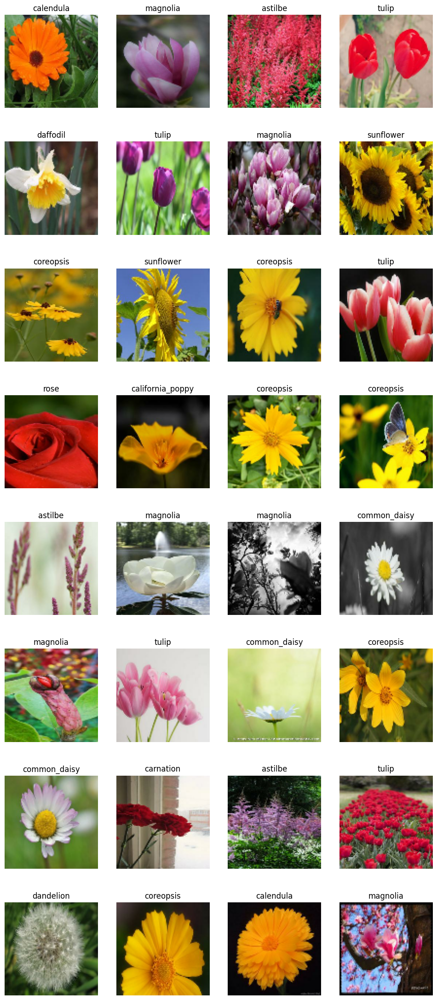

In [3]:
# visualize a few random flowers
plt.figure(figsize=(12, 28))

for images, labels in flower_generator.take(1):
  for i in range(len(images)):
      ax = plt.subplot(8, 4, i + 1)
      plt.imshow(images[i].numpy().astype("uint8"))
      plt.title(flower_names[labels[i]])
      plt.axis("off")

In [6]:
ENCODING_SIZE = 8 

# build a VAE based on AE structure above
class Sampling(keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        kl_loss = -0.5 * K.sum(1 + log_var - K.square(mean) - K.exp(log_var), axis=-1)
        self.add_loss(K.mean(kl_loss) / 27648.)  # اضف خسارة KL
        return K.random_normal(tf.shape(log_var)) * K.exp(log_var / 2) + mean


inputs = keras.layers.Input(shape = [IMG_WIDTH, IMG_HEIGHT, 3])
z = keras.layers.Conv2D(64, input_shape = [IMG_WIDTH, IMG_HEIGHT, 3], kernel_size = 3, 
                        strides = 1, padding = 'same', activation = 'selu',
                        kernel_initializer='lecun_normal')(inputs)
z = keras.layers.Conv2D(128, kernel_size = 3, strides = 2,
                        padding = 'same', activation = 'selu',
                        kernel_initializer='lecun_normal')(z)
z = keras.layers.Conv2D(256, kernel_size = 3, strides = 2,
                        padding = 'same', activation = 'selu',
                        kernel_initializer='lecun_normal')(z)
z = keras.layers.Conv2D(512, kernel_size = 3, strides = 2,
                        padding = 'same', activation = 'selu',
                        kernel_initializer='lecun_normal')(z)
z = keras.layers.Flatten()(z)
codings_mean = keras.layers.Dense(ENCODING_SIZE)(z)
codings_log_var = keras.layers.Dense(ENCODING_SIZE)(z)
codings = Sampling()([codings_mean, codings_log_var])
variational_encoder = keras.Model(inputs = [inputs], outputs = [codings_mean, codings_log_var, codings])

variational_encoder.summary()

decoder_inputs = keras.layers.Input(shape = [ENCODING_SIZE])
x = keras.layers.Dense(512 * 12 * 12, activation = "selu", input_shape = [ENCODING_SIZE])(decoder_inputs)
x = keras.layers.Reshape([12, 12, 512])(x)
x = keras.layers.Conv2DTranspose(filters = 512, kernel_size = 3, strides = 1,
                                 padding = "same", activation = "selu")(x)
x = keras.layers.Conv2DTranspose(filters = 256, kernel_size = 3, strides = 2,
                                 padding = "same", activation = "selu")(x)
x = keras.layers.Conv2DTranspose(filters = 128, kernel_size = 3, strides = 2,
                                 padding = "same", activation = "selu")(x)
x = keras.layers.Conv2DTranspose(filters = 64, kernel_size = 3, strides = 2,
                                 padding = "same", activation = "selu")(x)
outputs = keras.layers.Conv2DTranspose(filters = 3, kernel_size = 3, strides = 1,
                                       padding = 'same', activation = 'sigmoid')(x)
variational_decoder = keras.Model(inputs = [decoder_inputs], outputs = [outputs])

variational_decoder.summary()

_, _, codings = variational_encoder(inputs)
reconstructions = variational_decoder(codings)
vae = keras.Model(inputs = [inputs], outputs = [reconstructions])

vae.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 96, 96, 3)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 96, 96, 64)     │          1,792 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)         │ (None, 48, 48, 128)    │         73,856 │ conv2d_8[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_10 (Conv2D)        │ (None, 24, 24, 256)    │        295,168 │ conv2d_9[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_11 (Conv2D)        │ (None, 12, 12, 512)    │      1,180,160 │ conv2d_10[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_2 (Flatten)       │ (None, 73728)          │              0 │ conv2d_11[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_6 (Dense)           │ (None, 8)              │        589,832 │ flatten_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_7 (Dense)           │ (None, 8)              │        589,832 │ flatten_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sampling_2 (Sampling)     │ (None, 8)              │              0 │ dense_6[0][0],         │
│                           │                        │                │ dense_7[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,730,640 (10.42 MB)

 Trainable params: 2,730,640 (10.42 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 8)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 73728)               │         663,552 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_2 (Reshape)                  │ (None, 12, 12, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_10                  │ (None, 12, 12, 512)         │       2,359,808 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_11                  │ (None, 24, 24, 256)         │       1,179,904 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_12                  │ (None, 48, 48, 128)         │         295,040 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_13                  │ (None, 96, 96, 64)          │          73,792 │
│ (Conv2DTranspose)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_14                  │ (None, 96, 96, 3)           │           1,731 │
│ (Conv2DTranspose)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,573,827 (17.45 MB)

 Trainable params: 4,573,827 (17.45 MB)

 Non-trainable params: 0 (0.00 B)

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 96, 96, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ functional_6 (Functional)            │ [(None, 8), (None, 8),      │       2,730,640 │
│                                      │ (None, 8)]                  │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ functional_7 (Functional)            │ (None, 96, 96, 3)           │       4,573,827 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,304,467 (27.86 MB)

 Trainable params: 7,304,467 (27.86 MB)

 Non-trainable params: 0 (0.00 B)

In [7]:
# add learning rate scheduling 
def exponential_decay_fn(epoch):
  return 0.0001 * 0.1 ** (epoch / 10)

lr_scheduler = keras.callbacks.LearningRateScheduler(exponential_decay_fn)

# add early stopping
early_stopping_cb = keras.callbacks.EarlyStopping(patience = 5, restore_best_weights = True)

# clear the session for a clean run
keras.backend.clear_session()
tf.random.set_seed(42)

vae.compile(loss = 'mean_squared_error', optimizer = keras.optimizers.Nadam())
history = vae.fit(X_train, validation_data = X_valid,  epochs = 50, \
                  callbacks = [lr_scheduler, early_stopping_cb])

Epoch 1/50


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_44']
Received: inputs=Tensor(shape=(None, 96, 96, 3))
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_53']
Received: inputs=Tensor(shape=(None, 8))
  warnings.warn(msg)
I0000 00:00:1747250987.797383     101 service.cc:148] XLA service 0x7c61bc015ba0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1747250987.798331     101 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1747250988.521930     101 cuda_dnn.cc:529] Loaded cuDNN version 90300


  3/394 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - loss: 0.0933  

I0000 00:00:1747250994.865375     101 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


394/394 ━━━━━━━━━━━━━━━━━━━━ 43s 75ms/step - loss: 0.0537 - val_loss: 0.0380 - learning_rate: 1.0000e-04
Epoch 2/50
394/394 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.0365 - val_loss: 0.0360 - learning_rate: 7.9433e-05
Epoch 3/50
394/394 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.0351 - val_loss: 0.0353 - learning_rate: 6.3096e-05
Epoch 4/50
394/394 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.0344 - val_loss: 0.0349 - learning_rate: 5.0119e-05
Epoch 5/50
394/394 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.0341 - val_loss: 0.0346 - learning_rate: 3.9811e-05
Epoch 6/50
394/394 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.0338 - val_loss: 0.0345 - learning_rate: 3.1623e-05
Epoch 7/50
394/394 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.0336 - val_loss: 0.0345 - learning_rate: 2.5119e-05
Epoch 8/50
394/394 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.0335 - val_loss: 0.0344 - learning_rate: 1.9953e-05
Epoch 9/50
394/394 ━━━━━━━━━━━━━━━━━━━━ 22s 56ms/step - loss: 0.0334 - val_loss: 0.

## Random Flower Generation 

Using the trained VAE, images were generated by decoding a set of random encoding values.  Looking at the results, they could be considered "flower-like" with some much more like flowers than others, but generally they aren't convincing.  

Each image has a centralized, colored shape that is typically surrounded by a green background.  This is likely reflective of the typical image having a single central flower with a dark or leafy/grassy background.  Increasing or decreasing the number of convolutional layers or the number of features in each convolutional layer lead to images with less detail and less sharp colors.

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_53']
Received: inputs=Tensor(shape=(20, 8))
  warnings.warn(msg)


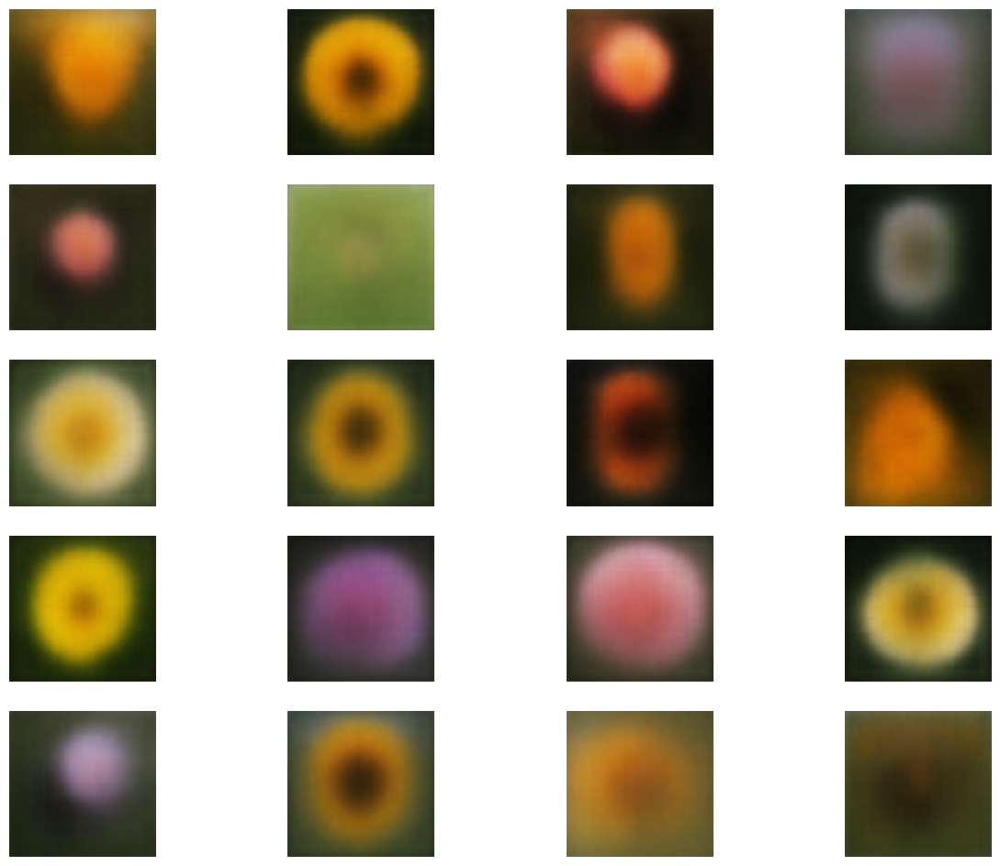

In [8]:
# visualize a few simulated flowers based on random sampling of means
random_codings = tf.random.normal(shape = [20, ENCODING_SIZE])
images = variational_decoder(random_codings).numpy()

plt.figure(figsize=(15, 12))

for i, image in enumerate(images):
  ax = plt.subplot(5, 4, i + 1)
  plt.imshow(image)
  plt.axis("off")

## Average Flower Generation 

Rather than generating images from random encoding values, the following parses the entire image dataset and for each flower type and computes the average encoding values.  Each average flower type representation is then decoded to generate the averge expected image for that flower type.  The figure shows 3 random examples for each flower type and the third image is processed through the variational autoencoder to evaluate the reconstruction. The last column shows an image generted from the average of encodings for each given flower type, providing insight into how the network internally represents each flower type in general.  

In [16]:
# Set up a dictionary to store mean encodings and examples for each flower type
flower_means = {
    name: {'count': 0, 'means': np.zeros(ENCODING_SIZE)} for name in flower_names
}
flower_examples = {}

# Limit number of batches to process (optional)
steps = 100  # or any number suitable for your dataset

# Process batches from the flower_generator dataset
for images, labels in flower_generator.take(steps):
    images = images / 255.0  # Normalize images to [0,1]
    
    means, _, _ = variational_encoder.predict(images, verbose=0)

    for idx, mean in enumerate(means):
        flower_name = flower_names[int(labels[idx])]  # Convert label to string name

        # Update count and add mean vector
        flower_means[flower_name]['count'] += 1
        flower_means[flower_name]['means'] += mean

        # Store up to 3 example images for each flower type
        if flower_name not in flower_examples:
            flower_examples[flower_name] = []

        if len(flower_examples[flower_name]) < 3:
            flower_examples[flower_name].append(images[idx])
        else:
            if random.random() < 0.5:
                flower_examples[flower_name][random.randint(0, 2)] = images[idx]

# Average the means
for k, v in flower_means.items():
    count = v['count']
    if count > 0:
        flower_means[k]['means'] = v['means'] / count

In [18]:
# Generate the "average flower" image for each flower type using the decoder
for flower_name, data in flower_means.items():
    mean_vector = np.expand_dims(data['means'], axis=0)  # shape (1, ENCODING_SIZE)
    decoded_image = variational_decoder.predict(mean_vector, verbose=0)[0]
    flower_means[flower_name]['average_flower'] = decoded_image

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_53']
Received: inputs=Tensor(shape=(1, 8))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


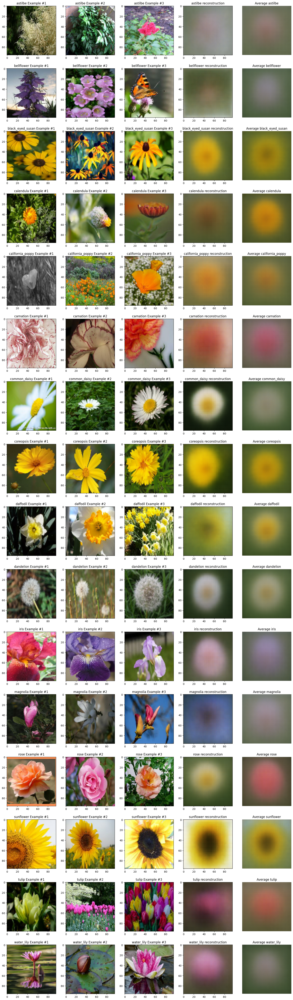

In [22]:
# compare examples, an example run through VAE
# and average flower
plt.figure(figsize=(20, 70))

for i, (k, v) in enumerate(flower_means.items()):
  original_example = flower_examples[k][2] # just process the third one
  processed_example = vae.predict(original_example[None, ...])
  average_flower = flower_means[k]['average_flower']

  ax = plt.subplot(16, 5, i * 5 + 1)
  plt.imshow(flower_examples[k][0])
  plt.title(k + ' Example #1')
  ax = plt.subplot(16, 5, i * 5 + 2)
  plt.imshow(flower_examples[k][1])
  plt.title(k + ' Example #2')
  ax = plt.subplot(16, 5, i * 5 + 3)
  plt.imshow(flower_examples[k][2])
  plt.title(k + ' Example #3')
  ax = plt.subplot(16, 5, i * 5 + 4)
  plt.imshow(np.array(processed_example).squeeze())
  plt.title(k + ' reconstruction')
  ax = plt.subplot(16, 5, i * 5 + 5)
  plt.imshow(average_flower)
  plt.title('Average ' + k)
  plt.axis("off")

In [24]:
vae.save('/kaggle/working/my_model.h5')